# Creating synthetic data: 
## An actual image, advected (warped, pixels remapped)

First just test warping and brightness modulation. Then below, use an actual candidate wave with properties from the literature. 

In [190]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
from openpiv import tools, pyprocess, validation, filters, scaling 

# https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.map_coordinates.html

import scipy 
from scipy import ndimage

In [4]:
!ls -1 DATA/*9_06_16*png

DATA/image_2_2022_09_06_16_15_00Z.png
DATA/image_3_2022_09_06_16_45_00Z.png


In [73]:
img = imageio.v2.imread('DATA/image_2_2022_09_06_16_15_00Z.png')

In [292]:
red = img[0:,400:,0] # just the red channel and just 400:end in the x dir
red = np.flipud(red)  # for pcolormesh, rather than imshow which has y increase downward on page 
red.shape[0], red.shape[1]  # y, x on page

(1024, 1108)

In [293]:
# Get the dimensions of the image
height, width = red.shape[:2]

# Create 2D arrays of x and y
x = np.arange(width)
y = np.arange(height)

# Create a meshgrid of x and y
X, Y = np.meshgrid(x, y)

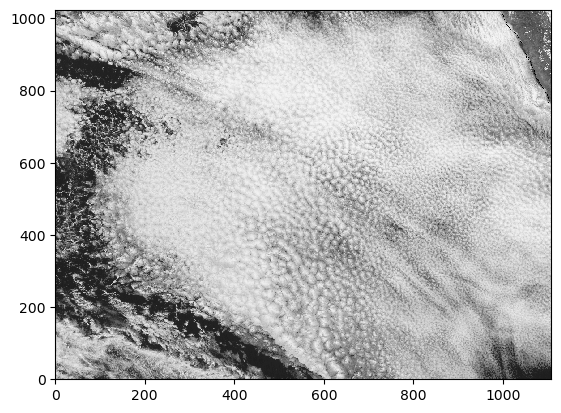

In [284]:
plt.pcolormesh(-red, cmap='Greys') #imshow flips y axis rel. to pcolormesh

-------------------

# Wave parameters for warping and modulating an image

"In one period, 7–9 October 2008, the waves modulated cloud-top-height by up to 400 m peak-to-trough, propagating perpendicular to the synoptic boundary layer flow with phase speed 15.3 m s−1, period ∼1 h and horizontal wavelength 55 km. The gravity waves were observed to be non-dispersive. “ from https://doi.org/10.1002/qj.1952

For a wave moving toward 45 degrees (northeast), define k and l as positive (sin and cos of nav angle). Let's take z = sin( k(x-ct) + l(y-ct) ) which is indeed moving NEward with time. Then u and v are both positive at z crests (sketch it). That means dx and dy are positve when time is 1/4 period later, or when 90deg of phase have been subtracted since t appears with a negative sign in the formula for phase (x-ct). 

In [371]:
# Pixel size: nominal for MKS units to pixel units 
DX = 2000             # m, pixel size (nominal)


# Mean wind: SE-NW and with divergence 
U = -1                # m/s
dUdx = 0.5e-6           # /s, 1e-5 is 1 m/s per 100km diffluence
V =  1                # m/s 
dVdy = 0.5e-6           # /s, 1e-5 is 1 m/s per 100km diffluence


# Wave properties, taken from a paper on VOCALS waves roughly (a bit longer wavelength for clarity here)
cphase = 10            # m/s
wavelength = 200*1000. # meters
period = wavelength/cphase 

direction = 225       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude = 100      # meters, vertical displacement
PBLdepth = 1000       # m, divergent winds assumed to be constant through this layer  

# Amplitude modulation by a big smooth Gaussian 
packet_center_x = 0  # from middle of Xm, Ym coordinates  
packet_center_y = 0  # from middle of Xm, Ym coordinates  
packet_width_x  = 400*1000.  # meters! 
packet_width_y  = 800*1000.  # meters! 



# Wavenumbers computed from wavelengths and direction, units inverse meters 
k = 2*np.pi/wavelength * np.sin( (direction) *np.pi/180 )   # add 1e-9 in case of 0 denominator
l = 2*np.pi/wavelength * np.cos( (direction) *np.pi/180 )   # add 1e-9 in case of 0 denominator

# Xm and Ym are Coordinates in meters, distances measured from central point 
Xm = (X-X.mean())*DX
Ym = (Y-Y.mean())*DX 

Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                      ((Ym-packet_center_y)/packet_width_y)**2 )) 

print( period, divamplitude, udivamp, k, l )

20000.0 3.75e-06 0.75 -2.2214414690791825e-05 -2.2214414690791832e-05


## Animation displays for time-dependent warped imagery texture 

In [372]:
# Constants for this animation 
time_steps = 12            # Number of time steps 
time_resolution = 1800     # seconds

# The resulting image arrays, for animation 
grid = np.zeros((height, width, time_steps))

# BUILD THE WARPED MODULATED IMAGES AT EACH TIME

for it in range(time_steps):
    t = it*time_resolution     # t is in seconds 

# dz measures vertical displacements: let's choose the sine function
    dz = zamplitude \
         * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) ) *Ampwindow

# wave dx and dy are 90deg behind phase with dz, prop. to wavelength. 
# DIRECTION: For 45deg (wave going NE), k>0,l>0, dx>0,dy>0 (sketch it). 

    dxy = (zamplitude/PBLdepth)*wavelength \
          * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) -np.pi/2.) /DX
    dx = dxy * np.sin(direction *np.pi/180.) *Ampwindow # why /2? because it is too strong. Pixel units?? 
    dy = dxy * np.cos(direction *np.pi/180.) *Ampwindow

# Larger-scale (non wave) velocity for advecting pixels 
    u = U + dUdx*Xm   
    v = V + dVdy*Ym   
    
# Warping by transporting pixels in original red image, wrapping (periodic) for now. SUBTRACT dy and dx in argument. 
    grid[:,:,it] = ndimage.map_coordinates(-red,[Y-dy, X-dx])  #, mode='grid-wrap' )
# add in mean advection too 
    grid[:,:,it] = ndimage.map_coordinates(-red,[Y- (dy +v*t/DX), X- (dx +u*t/DX)])  #, mode='grid-wrap' )

# Modulate (multiply) albedo by a wavy pattern (vertical displacements, 
#           make consistent with xmotion and ymotion arrays above) 
    grid[:,:,it] *= (1 + dz/PBLdepth)  
    
maxvalue = grid.max()
maxvalue

255.0376572589383

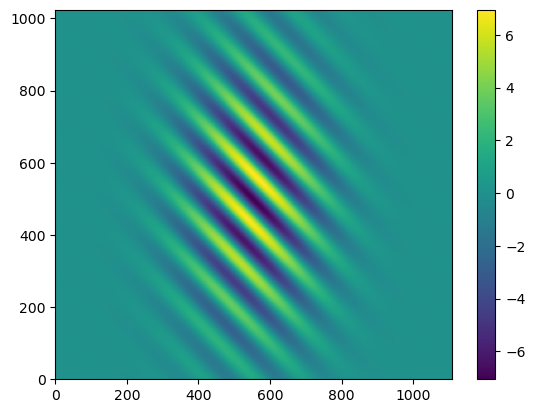

In [373]:
plt.pcolormesh(dy); plt.colorbar() # pixels units -- why does 7 pixels make such a huge warp??? study map_coordinates docs 

In [374]:
grid.shape

(1024, 1108, 12)

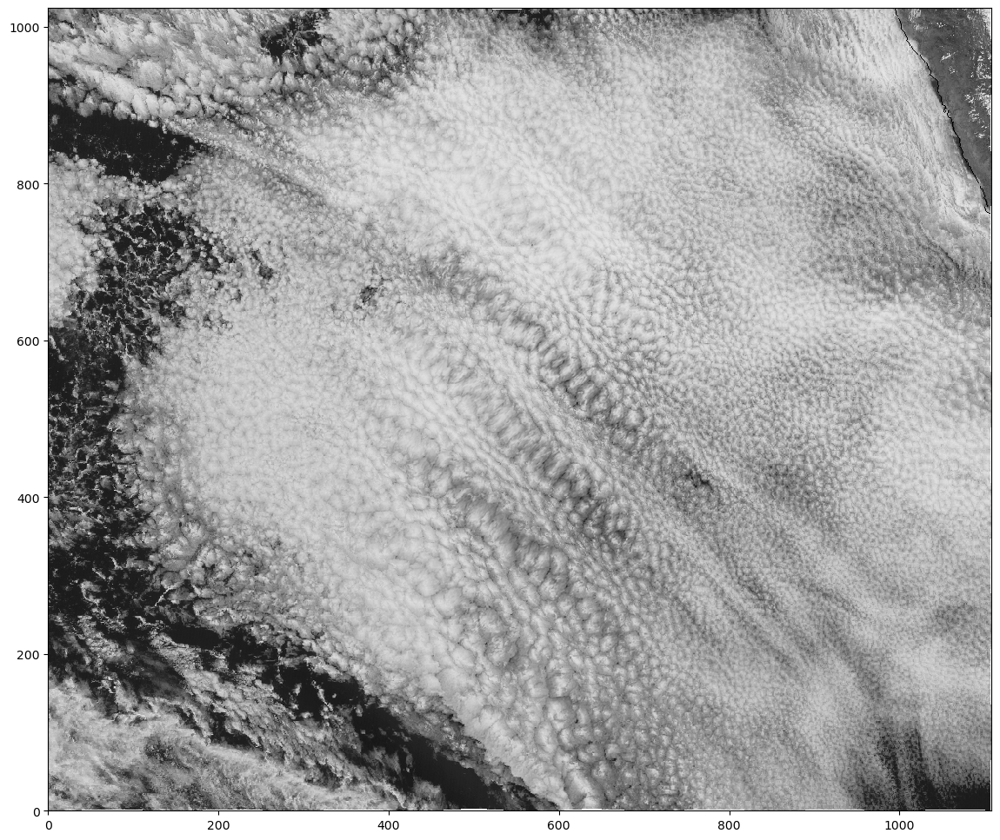

In [375]:
plt.figure(figsize=(14,12))
plt.pcolormesh(grid[:,:,0], cmap='Greys')

# Display it! 

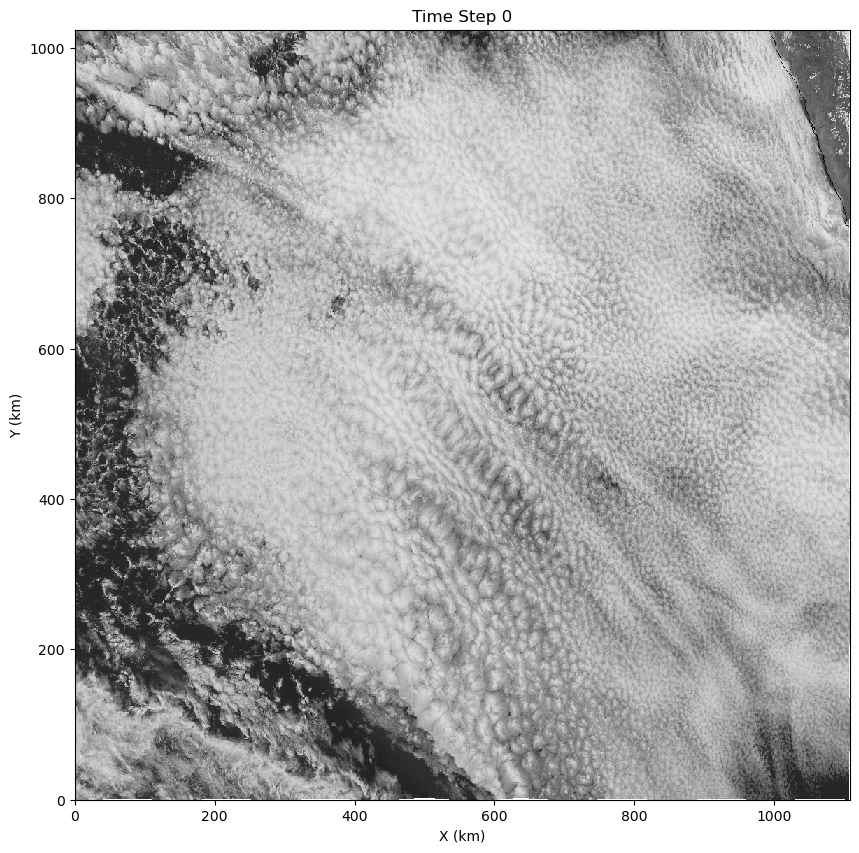

In [376]:
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))  

# Function to initialize the animation 
def init():
    im = ax.pcolormesh(grid[:, :, 0],vmin=0,vmax=maxvalue,cmap='Greys');
    plt.title(f'Time Step 0')
    plt.xlabel('X (km)')
    plt.ylabel('Y (km)')
    return [im]

# Function to animate the frames
def animate(it):
    im = ax.pcolormesh(grid[:, :, it],vmin=0,vmax=maxvalue,cmap='Greys')
    plt.title(f'Time Step {t}')
    return [im]

# Create an animation
ani = animation.FuncAnimation(fig, animate, init_func=init, frames=grid.shape[2], repeat=True)

# Display the animation in the Jupyter Notebook
HTML(ani.to_jshtml())


In [ ]:
ani.save('stratocu_waves/DATA/syn_scwave_warp_mod.mp4',writer='ffmpeg', fps=5)

MovieWriter ffmpeg unavailable; using Pillow instead.
